In [11]:
# pip install mrcnn

download the model from following link and store it in dicrectory where notebook is located

'https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5'

In [12]:
import os
import sys
import random
import numpy as np
import matplotlib.pyplot as plt

In [13]:
import mrcnn
from mrcnn.config import Config
from mrcnn import model as modellib, utils
from mrcnn import visualize

2023-12-29 13:05:16.214088: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-29 13:05:16.218128: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-29 13:05:16.280153: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-29 13:05:16.280205: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-29 13:05:16.282396: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to

In [14]:
class CocoConfig(Config):
  # Adjust settings as needed, for example:
  NAME = "coco" # Model name
  IMAGES_PER_GPU = 1 # Images per GPU during training
  NUM_CLASSES = 81 #Number of classes (80 for COCO)

In [15]:
model = modellib.MaskRCNN(mode="inference", config=CocoConfig(),
model_dir="logs")
model.load_weights("mask_rcnn_coco.h5", by_name=True) # Load pre-trained COCO weights

Instructions for updating:
Use fn_output_signature instead


In [16]:
dataset = utils.Dataset()
dataset.add_image(source="my_source",
                  image_id=0,  # use an integer as image_id
                  path="dog.jpg")  # path to the image file

image = dataset.load_image(0)  # use the same image_id

In [17]:
results = model.detect([image], verbose=1)

Processing 1 images
image                    shape: (400, 401, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


W0000 00:00:1703835334.005415   32143 op_level_cost_estimator.cc:699] Error in PredictCost() for the op: op: "CropAndResize" attr { key: "T" value { type: DT_FLOAT } } attr { key: "extrapolation_value" value { f: 0 } } attr { key: "method" value { s: "bilinear" } } inputs { dtype: DT_FLOAT shape { dim { size: -50 } dim { size: 256 } dim { size: 256 } dim { size: 256 } } } inputs { dtype: DT_FLOAT shape { dim { size: -19 } dim { size: 4 } } } inputs { dtype: DT_INT32 shape { dim { size: -19 } } } inputs { dtype: DT_INT32 shape { dim { size: 2 } } value { dtype: DT_INT32 tensor_shape { dim { size: 2 } } int_val: 7 } } device { type: "CPU" vendor: "GenuineIntel" model: "101" frequency: 2100 num_cores: 16 environment { key: "cpu_instruction_set" value: "AVX SSE, SSE2, SSE3, SSSE3, SSE4.1, SSE4.2" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 32768 l2_cache_size: 1048576 l3_cache_size: 11534336 memory_size: 268435456 } outputs { dtype: DT_FLOAT shape { dim { size: -19 } dim 

In [18]:
class_names = ["person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana", "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake", "chair", "couch", "potted plant", "bed", "dining table", "toilet", "tv", "laptop", "mouse", "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator", "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]

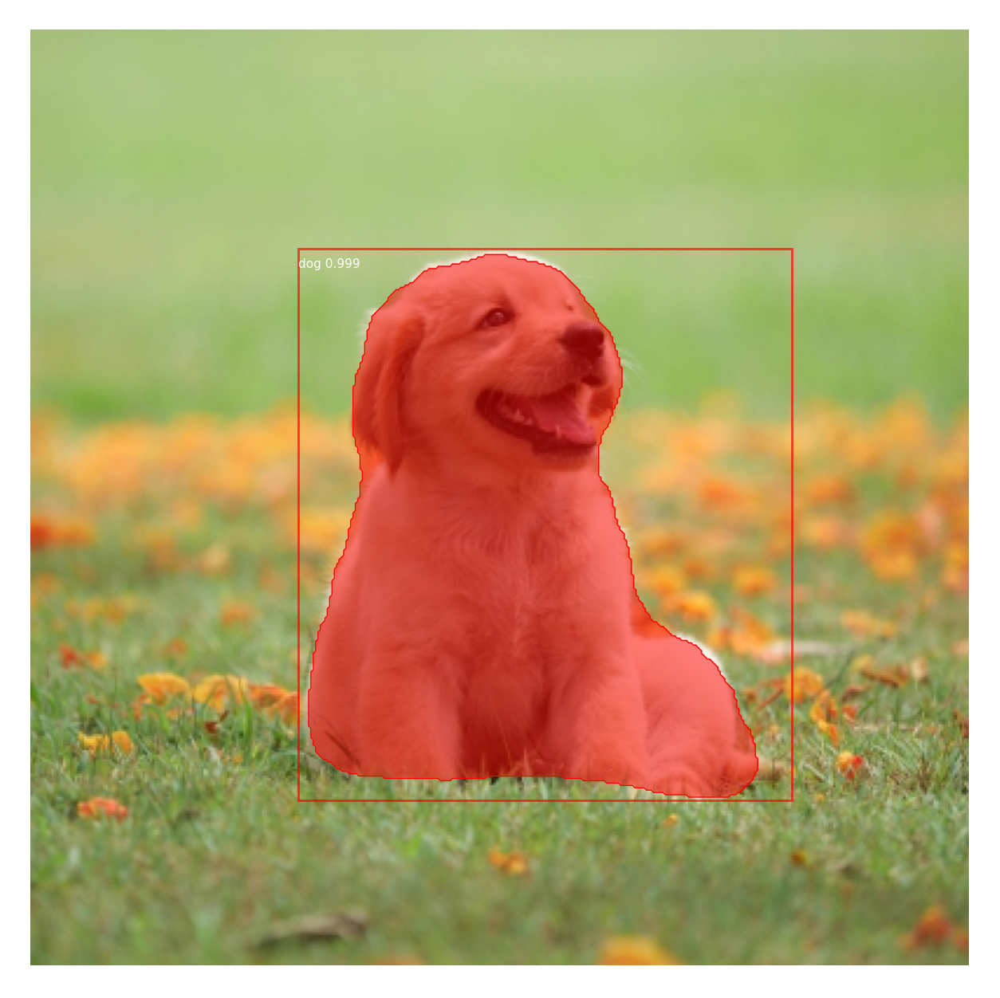

In [19]:
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids']-1, class_names, r['scores'])

In [31]:
lst = []
def create_mask(folder_dir):
    for images in os.listdir(folder_dir):
        if (images.endswith(".png") or images.endswith(".jpg")):
            lst.append(images)
    img_dir = {k+1: v for k, v in enumerate(lst)}
    
    for k,v in img_dir.items():
        dataset.add_image(source="my_source", image_id=k,  path=v)  
        image = dataset.load_image(k)
        results = model.detect([image], verbose=0)
        r = results[0]
        visualize.display_instances(image, r['rois'], r['masks'], r['class_ids']-1, class_names, r['scores'])


In [21]:
import os

In [22]:
folder_dir = "/home/dai/Documents/NLP & CV/Dec29_CV"
for images in os.listdir(folder_dir):
 
    # check if the image ends with png
    if (images.endswith(".png") or images.endswith(".jpg")):
        print(images)

strawberry.jpg
donuts.png
he.jpg
she.jpg
jungle.jpg
dog.jpg
cat.jpg


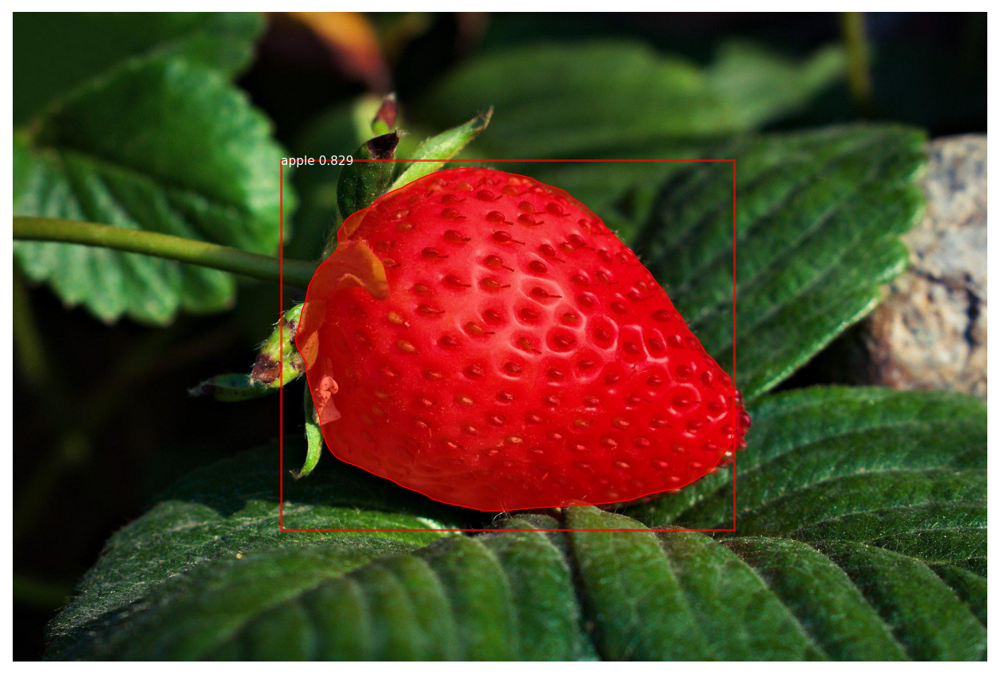

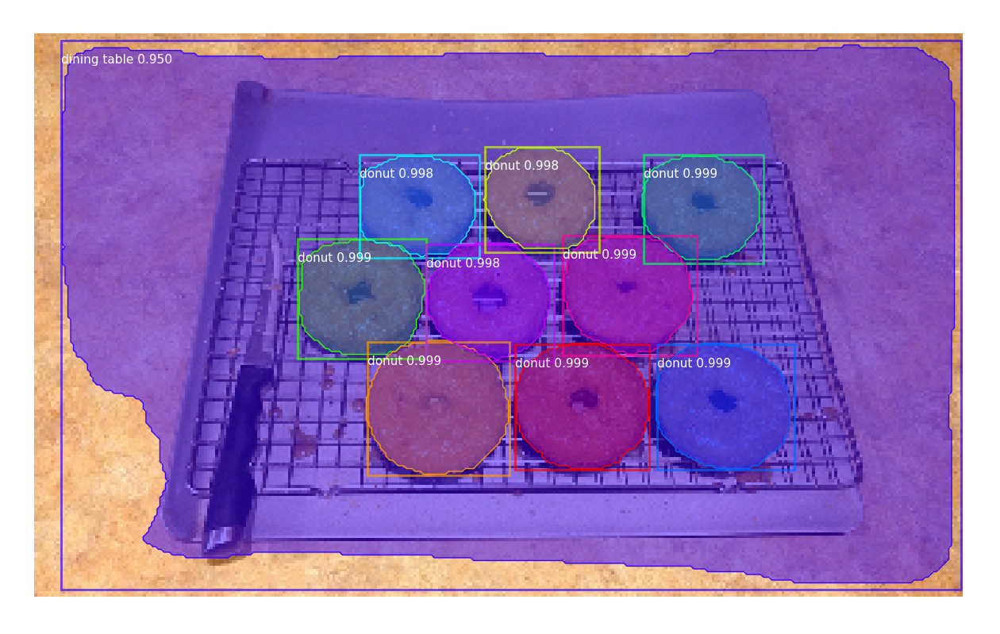

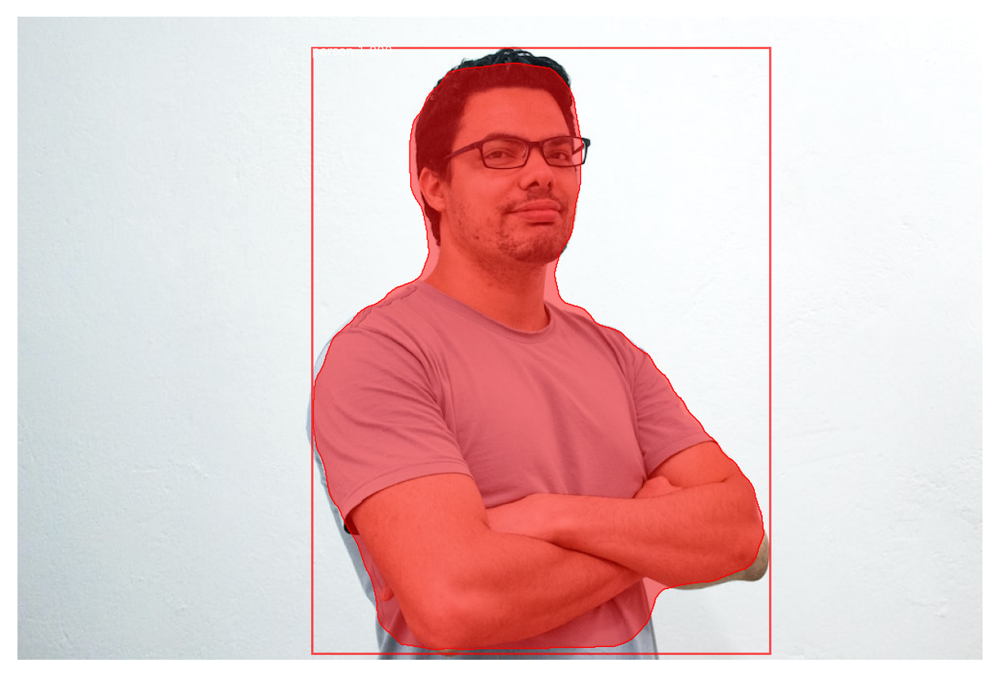

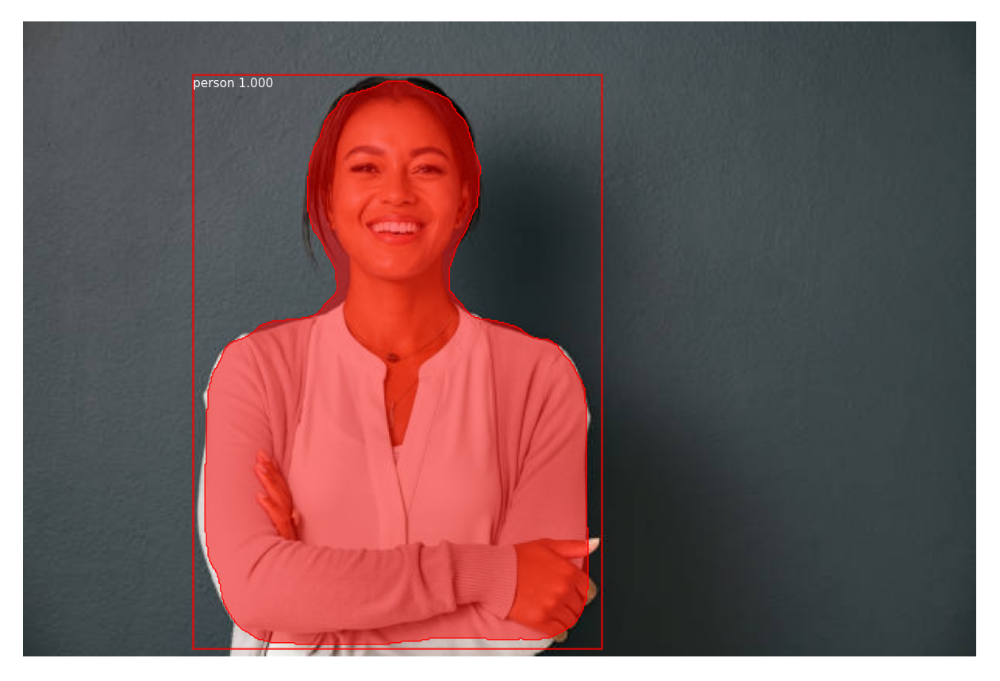

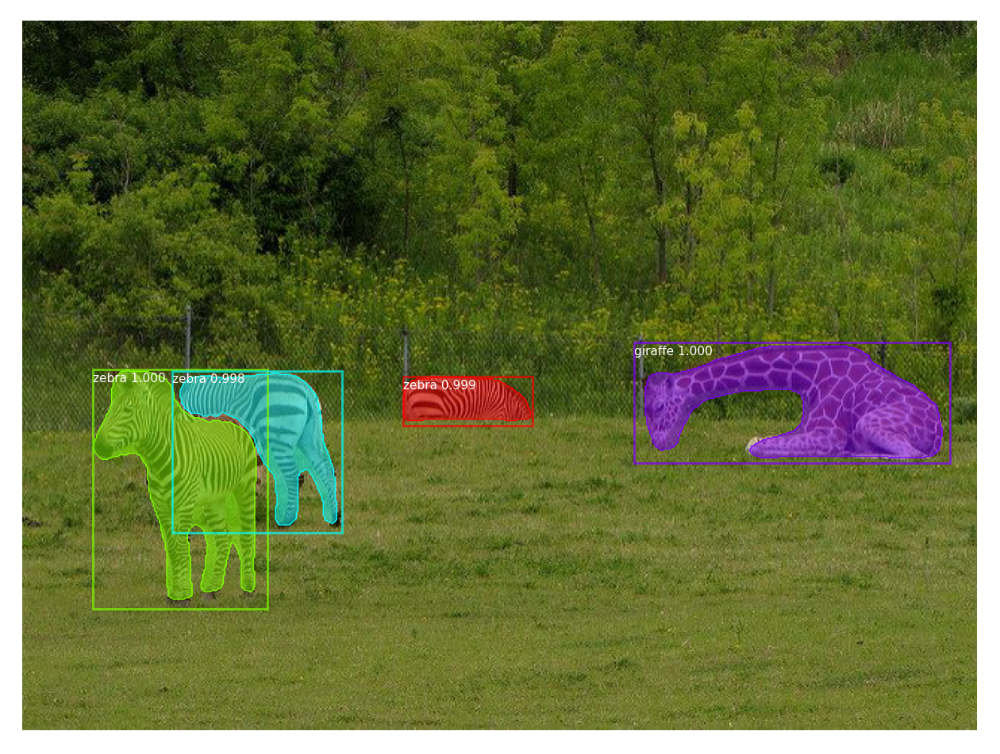

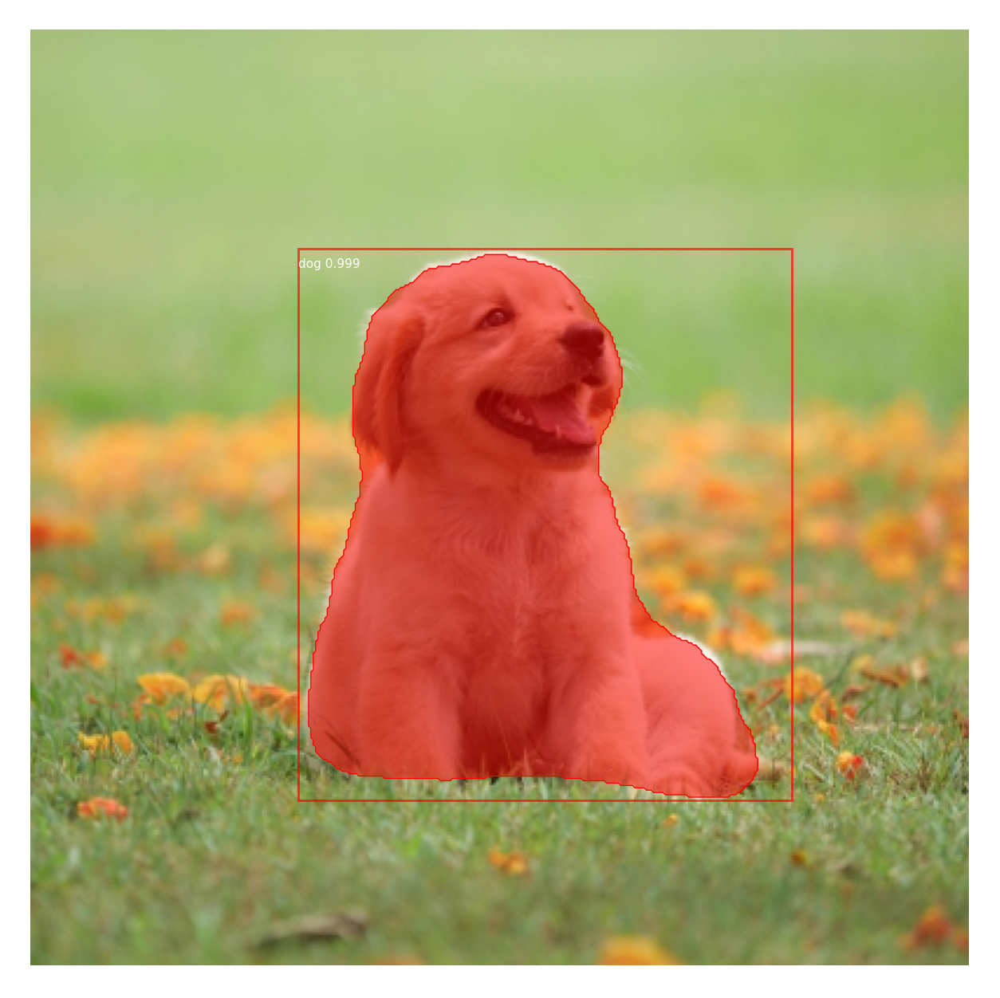

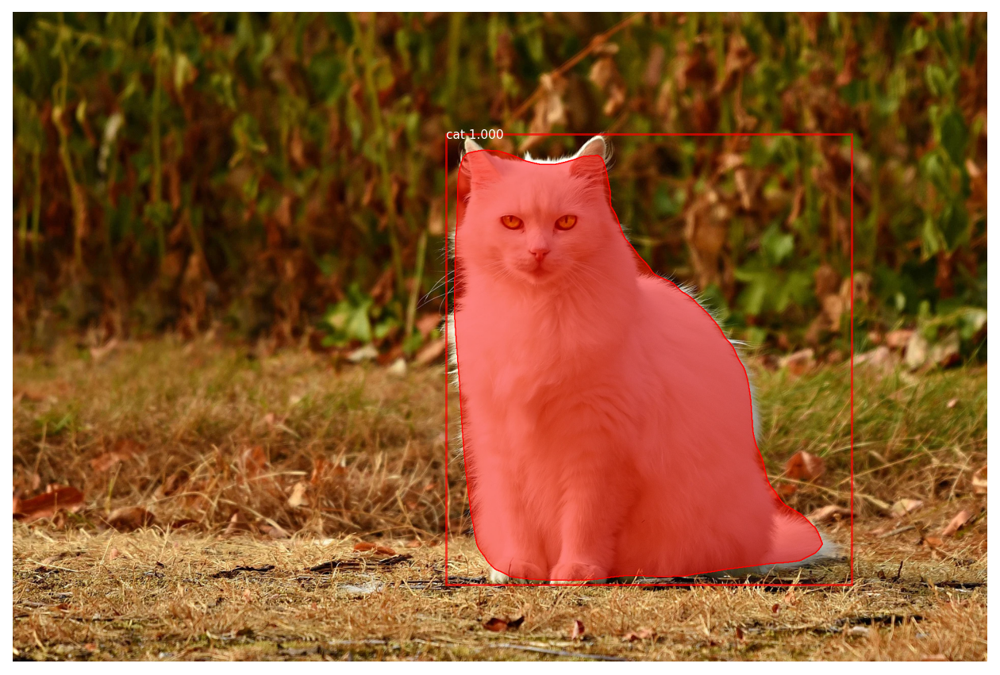

In [32]:
create_mask(folder_dir)